In [1]:
# from regelum.scenario import Scenario
from regelum.simulator import CasADi
import numpy as np

from regelum.utils import rg
from regelum.model import ModelWeightContainer
# Max Iteration count may be added in opt_options={"print_level": 0, "max_iter": MAX_ITER},
from regelum.optimizable.core.configs import CasadiOptimizerConfig
from regelum.predictor import EulerPredictor
from regelum.objective import RunningObjective
from regelum.critic import CriticTrivial
from regelum.scenario import RLScenario
from regelum.event import Event

import sys
sys.path.append('../')

from src.system import HydraulicSystem, StationaryHydraulicSystem
from src.observer import StationaryHydraulicObserver
from src.objective import HydraulicObjectiveModel
from src.policy import MPC
from src.animation_ru import HydraylicAnimation

import random

random.seed(44)

In [2]:
from regelum.callback import (
    ScenarioStepLogger,
    # StateTracker,
    # HistoricalDataCallback,
)
from src.callback import HistoricalDataCallback, SimulatorStepLogger

from regelum import set_ipython_env
%matplotlib inline
callbacks = [SimulatorStepLogger, ScenarioStepLogger, HistoricalDataCallback]
ScenarioStepLogger.cooldown = 0.01
callbacks = set_ipython_env(callbacks=callbacks, interactive=True)

In [3]:
MAX_STEP = 1e-7
PREDICTION_HORIZON = 5
FINAL_TIME = 10e-3
SAMPLING_TIME = 1e-3
ACTION_SIZE = 1

pred_step_size = 1 * SAMPLING_TIME

# Define the initial state
p_atm = 1e5
initial_state = rg.array([1e3, 0, 0, p_atm, p_atm])

model = ModelWeightContainer(
    dim_output=ACTION_SIZE, 
    weights_init=rg.zeros((PREDICTION_HORIZON + 1, ACTION_SIZE), rc_type=rg.CASADI)
)  # A trivial model contains our predicted actions

# system = HydraulicSystem(
#     init_state=initial_state
# )

# # Update observation noize std
# system.update_system_parameters(
#     {
#         "jet_length_std": 2e-1, # Was 10e-2
#         "jet_velocity_std": 1e-1, # Was 2e-2
#     }
# )

system = HydraulicSystem(
    init_state=initial_state,
    system_parameters_init = {
            "p_l_gauge": 1.5e5,
            "x_th_limits": (0., 20.),
            "freq_th": 500.0,
            "m_p": 20e-3,
            "D_th": 200e-6, # WAS 200e-6, then 5e-3
            "D_hydr": 20e-3,
            "D_work": 20e-3,
            "h_work_init": 1e3,
            "D_exit": 0.33e-3,
            "l_exit": 8.5e-3,
            "p_coulomb": 10e3, # WAS 10e3, then 1e3
            "eta": 0.70,
            "zeta_th": 5.0, # WAS 5.0, then 0.1
            "rho_hydr": 1e3,
            "rho_work": 1e3,
            "beta_v_hydr": 0.49e-9,
            "beta_v_work": 0.49e-9,
            "sigma_work": 73e-3,
            "mu_work": 1.0e-3,
            "v_j": 200.,
            "jet_length_std": 1e-1, # Was 10e-2
            "jet_velocity_std": 10, # Was 2e-2
            "pressure_std": 0.,
            "p_atm": 1e5, # Atmosphere (ambient) pressure, Pa
            "g": 9.81, # gravity constant, m/s^2
        },
)


system_model = StationaryHydraulicSystem(
    init_state=initial_state
)
observer = StationaryHydraulicObserver(
    system=system_model
)
predictor = EulerPredictor(
    system=system_model, pred_step_size=pred_step_size
)  # Predictor is used for MPC-prediction

# RUNNING OBJECTIVE
running_objective_model = HydraulicObjectiveModel(
    system=system_model,
    quad_matrix_type="diagonal", weights=[1, 0, 0]
)  # A quadratic model for running (a.k.a. instant) objective
running_objective = RunningObjective(
    model=running_objective_model
)  # Wrap `running_objective_model` into `RunningObjective` class

# Update observation noize std
system.update_system_parameters(
    {
        "jet_length_std": 5e-2, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

system_model.update_system_parameters(
    {
        "jet_length_std": 1e-1, # Was 10e-2
        "jet_velocity_std": 10, # Was 2e-2
    }
)

simulator = CasADi(
    system=system,
    state_init=initial_state,
    action_init=rg.array([0]),
    time_final=FINAL_TIME,
    max_step=MAX_STEP,
)

scenario = RLScenario(
    policy=MPC(
        model=model,
        system=system_model,
        action_bounds=system_model.action_bounds,
        optimizer_config=CasadiOptimizerConfig(),
        prediction_horizon=PREDICTION_HORIZON,
        running_objective=running_objective,
        predictor=predictor
    ),
    observer = observer,
    critic=CriticTrivial(),  # mocked critic
    running_objective=running_objective,
    policy_optimization_event=Event.compute_action,  # run policy optimization on each step
    discount_factor=1.0,
    sampling_time=SAMPLING_TIME,
    simulator=simulator,
    N_episodes=1,
    N_iterations=1,
)

scenario.run()


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************



[02:01:30] INFO     runn. objective: 3.37, state est.: [1000.02   -0.39   -0.02], observation: [   ]8;id=185247;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=398006;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.09 -1.43], action: [20.], value: 0.0034, time: 0.0000 (0.0%), episode: 1/1,                  
                    iteration: 1/1                                                                                 

[02:01:46] INFO     runn. objective: 3.36, state est.: [1000.03  125.22    8.36], observation: [   ]8;id=122316;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=596313;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.09 459.96], action: [20.], value: 0.0067, time: 0.0010 (10.0%), episode:                     
                    1/1, iteration: 1/1                                                                            

[02:02:05] INFO     runn. objective: 1.66, state est.: [1000.17  188.98   12.63], observation: [   ]8;id=538667;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=722279;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    0.64 694.15], action: [8.91], value: 0.0084, time: 0.0020 (20.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[02:02:26] INFO     runn. objective: 0.22, state est.: [1000.4   170.72   11.4 ], observation: [   ]8;id=619705;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=424723;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.46 627.08], action: [-11.49], value: 0.0086, time: 0.0030 (30.0%), episode:                  
                    1/1, iteration: 1/1                                                                            

[02:02:49] INFO     runn. objective: 0.05, state est.: [1000.47   34.79    2.32], observation: [   ]8;id=375688;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=77126;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.71 127.78], action: [0.77], value: 0.0087, time: 0.0040 (40.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[02:03:14] INFO     runn. objective: 0.00, state est.: [1000.52   26.47    1.76], observation: [   ]8;id=166774;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=117450;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.9  97.21], action: [-2.06], value: 0.0087, time: 0.0050 (50.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[02:03:43] INFO     runn. objective: 0.00, state est.: [1000.53    6.59    0.44], observation: [   ]8;id=283117;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=330750;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.95 24.22], action: [-1.06], value: 0.0087, time: 0.0060 (60.0%), episode:                    
                    1/1, iteration: 1/1                                                                            

[02:04:14] INFO     runn. objective: 0.01, state est.: [1000.51   -1.87   -0.12], observation: [   ]8;id=303779;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=36703;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.86 -6.85], action: [0.], value: 0.0087, time: 0.0070 (70.0%), episode: 1/1,                  
                    iteration: 1/1                                                                                 

[02:04:48] INFO     runn. objective: 0.00, state est.: [1000.51   -3.61   -0.23], observation: [   ]8;id=499233;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=961428;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    1.86 -13.27], action: [0.], value: 0.0087, time: 0.0080 (80.0%), episode: 1/1,                 
                    iteration: 1/1                                                                                 

[02:05:23] INFO     runn. objective: 0.02, state est.: [1000.56   -0.82   -0.05], observation: [   ]8;id=783408;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=260009;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.05 -3.03], action: [-0.], value: 0.0087, time: 0.0090 (90.0%), episode: 1/1,                 
                    iteration: 1/1                                                                                 

[02:05:57] INFO     runn. objective: 0.01, state est.: [1000.55    8.97    0.6 ], observation: [   ]8;id=856377;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py\callback.py]8;;\:]8;id=712886;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/regelum/callback.py#1109\1109]8;;\
                    2.04 32.95], action: [-3.39], value: 0.0087, time: 0.0100 (100.0%), episode:                   
                    1/1, iteration: 1/1                                                                            

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.371463,0.003371,1,1,20.000000,0.090148,-1.434412,1000.024543,-0.390519,-0.024360
1,0.001000,3.362292,0.006734,1,1,20.000000,0.092648,459.957431,1000.025223,125.223411,8.356747
2,0.002000,1.655325,0.008389,1,1,8.913911,0.639709,694.151832,1000.174161,188.982836,12.628168
3,0.003000,0.218782,0.008608,1,1,-11.493723,1.458562,627.075998,1000.397093,170.721440,11.403029
4,0.004000,0.045370,0.008653,1,1,0.774356,1.713301,127.778741,1000.466446,34.787762,2.319370
5,0.005000,0.000594,0.008654,1,1,-2.060157,1.901936,97.214035,1000.517802,26.466521,1.764518
6,0.006000,0.000512,0.008654,1,1,-1.064915,1.948929,24.222475,1000.530596,6.594569,0.439640
7,0.007000,0.005049,0.008659,1,1,0.000281,1.855247,-6.852282,1000.505091,-1.865534,-0.116369
8,0.008000,0.004787,0.008664,1,1,0.000274,1.857117,-13.268472,1000.505600,-3.612342,-0.225332
9,0.009000,0.016064,0.008680,1,1,-0.000502,2.053048,-3.029318,1000.558942,-0.824732,-0.051445


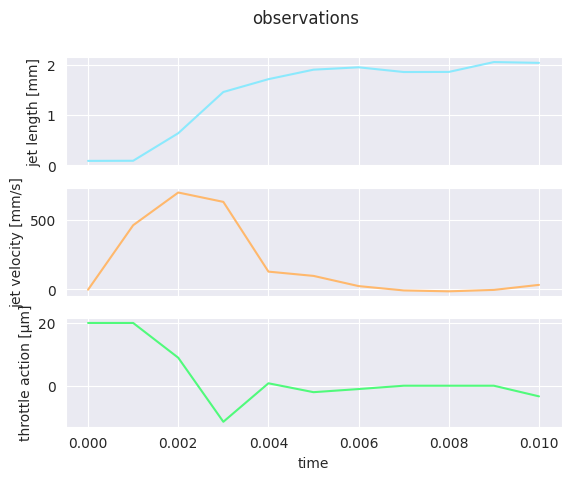

In [4]:
display(callbacks[-1].data)
callbacks[-1].plot(name="observations");

In [5]:
display(callbacks[0].data)

,time,jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm],hydraulic pressure [Pa],working pressure [Pa]
0,0.000000e+00,0.000000,0.000000,1000.000000,0.000000,0.000000,100000.000000,100000.000000
1,1.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.001000,100000.001581,100000.000000
2,2.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.002000,100000.006323,100000.000000
3,3.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.003000,100000.014227,100000.000000
4,4.000000e-07,0.000000,0.000000,1000.000000,0.000000,0.004000,100000.025291,100000.000000
...,...,...,...,...,...,...,...,...
99997,9.999700e-03,1.954653,2.380686,1000.532154,0.648142,-0.345959,107267.920771,100000.001051
99998,9.999800e-03,1.954653,1.759931,1000.532154,0.479141,-0.346128,107267.861872,100000.003111
99999,9.999900e-03,1.954653,1.138854,1000.532154,0.310053,-0.346298,107267.805413,100000.002872
100000,1.000000e-02,1.954653,0.517462,1000.532154,0.140879,-0.346467,107267.751412,100000.001541


## Display data and animation

In [6]:
state_trajectory = callbacks[0].data
observations = callbacks[-1].data
display(observations)
# callbacks[-1].plot(name="observations"); # Replace plot to own plot function!

# Clean callback
callbacks[0].reset()
callbacks[-1].clear_recent_data()

,time,running_objective,current_value,episode_id,iteration_id,throttle action [µm],jet length [mm],jet velocity [mm/s],piston position [µm],piston velocity [µm/s],throttle position [µm]
0,0.000000,3.371463,0.003371,1,1,20.000000,0.090148,-1.434412,1000.024543,-0.390519,-0.024360
1,0.001000,3.362292,0.006734,1,1,20.000000,0.092648,459.957431,1000.025223,125.223411,8.356747
2,0.002000,1.655325,0.008389,1,1,8.913911,0.639709,694.151832,1000.174161,188.982836,12.628168
3,0.003000,0.218782,0.008608,1,1,-11.493723,1.458562,627.075998,1000.397093,170.721440,11.403029
4,0.004000,0.045370,0.008653,1,1,0.774356,1.713301,127.778741,1000.466446,34.787762,2.319370
5,0.005000,0.000594,0.008654,1,1,-2.060157,1.901936,97.214035,1000.517802,26.466521,1.764518
6,0.006000,0.000512,0.008654,1,1,-1.064915,1.948929,24.222475,1000.530596,6.594569,0.439640
7,0.007000,0.005049,0.008659,1,1,0.000281,1.855247,-6.852282,1000.505091,-1.865534,-0.116369
8,0.008000,0.004787,0.008664,1,1,0.000274,1.857117,-13.268472,1000.505600,-3.612342,-0.225332
9,0.009000,0.016064,0.008680,1,1,-0.000502,2.053048,-3.029318,1000.558942,-0.824732,-0.051445


In [7]:
l_crit = system._parameters["l_crit"]
D_drop = system._parameters["D_drop"]
D_exit = system._parameters["D_exit"]*1e3
D_drop_rel = D_drop/D_exit

anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
anim_cl.animate_system(interacitve=True)

           INFO     Animation.save using <class 'matplotlib.animation.HTMLWriter'>                ]8;id=772848;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=885475;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\

Once 
 
 Loop 
 
 Reflect

Save results

In [8]:
anim_cl = HydraylicAnimation(
    state_trajectory, 
    observations, 
    l_crit, 
    D_drop_rel
)
# save animation
anim_cl.animate_system(save_gif=True, gif_filename = '../results/system_animation_mpc_noize_ru.gif')
# save last frame
anim_cl.save_last_frame('../results/system_last_observation_mpc_noize_ru.pdf')

[02:07:32] INFO     Animation.save using <class 'matplotlib.animation.PillowWriter'>              ]8;id=870823;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py\animation.py]8;;\:]8;id=493751;file:///home/vulf/.pyenv/versions/3.11.7/envs/acm-venv/lib/python3.11/site-packages/matplotlib/animation.py#1060\1060]8;;\